# 🌸🌷🌹🌻꽃 다중 분류🌺💐🌼🥀🪻

## 결과 정리 :
1. base_model : EfficientNetBo
    - epoch : 25 -> 얼리스토핑해서 14 epoch 실행.
    - 최적 모델의 성능 : 테스트 손실 (Loss): 0.2904 / 테스트 정확도 (Accuracy): 0.8937
2. 평가 루브릭 체크
    - 1) VGG16 등이 적절히 활용되었음
    - 2) loss, accuracy 그래프 및 임의 사진 추론 결과가 제시됨
    - 3) test accuracy가 85% 이상 도달하였음
3. ToDo
    - 1) 모델 선정이유, 하이퍼 파라미터 데이터 전처리
        - 등의 이유가 피어리뷰를 진행할 때 **주석으로 적기**.
    - 2) 데이터 분할, 하이퍼 파라미터, 시각화
        - 수행 여부 점검
    - 3) **회고를 작성**했는지 여부를 점검
    - 4) 앱의 동작 여부 확인


## 회고
- 이하은 :
    - 데이터 셋 준비부터 모델학습시키기, 최종 성능 확인하기까지 전체 흐름을 파악해 볼 수 있어서 앞으로 모델을 불러와서 사용할 때 도움이 될 것 같다.
    - 경로 문제, 버전 문제를 모두 해결하여 모델 학습을 진행하게 되었는데, 학습 속도가 너무 느리다는 점...이것이 로컬에서 GPU 없이 학습하는 한계...
    - 다음에는 이점까지 고려해서 프레임워크 선택하는 걸로!
- 이혜승 :
    - DL톤 진행 시 많이 헷갈렸던 부분- 시각화,증강,모델 훈련의 단계마다 인풋 데이터 shape 이 어떻게 바뀌는지 완벽히 이해하지 못했는데 차근차근 복습할 수 있는 시간이 되어서 좋았습니다.
    - tfds.load() 로 간편하게 내장 데이터셋을 불러올 수 있다는 걸 배웠습니다.
    - 타입캐스팅이라는 용어도 알게되서 개발자와 소통할 때 유용할 것 같습니다.
    - 모델 훈련 전에 검증 데이터로 예측률을 확인해보는 건 생각해보지 못했는데 굳이 그럴 필요가 있나 의문이 들었습니다.
    - 재은님 코드를 보면서 출력도 보기 좋게 꾸미고 데이터 점검도 소홀히 하지 않아야겠다고 생각했어요.재밌게 실험하시는 모습에 긍정적인 영향을 받았습니다.
    - 새로운 데이터셋과 어플리케이션 제작까지 팀 내에서 기획은 했지만 실행으로 옮기진 않았습니다. 이것은 다음 기회에.

## Step 0. 드라이브 **연동**

In [75]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Step 1. 데이터셋 내려받기


In [76]:
# tensorflow 버전 확인
import tensorflow_datasets as tfds

tfds.__version__

'4.9.8'

* Dataset Download
https://www.tensorflow.org/datasets/catalog/tf_flowers

In [77]:
# 구글 드라이브 마운트
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [78]:
# 데이터셋 불러오기 맟 저장 & 데이터 분할
import tensorflow_datasets as tfds

# Google Drive 내 저장
data_dir = '/content/drive/MyDrive/tfds/flowers'

# 데이터셋 로드 (tf_flowers 예시)
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir=data_dir,
    with_info=True,
    as_supervised=True
)

In [79]:
# 데이터셋 확인
print(raw_train)
print(raw_validation)
print(raw_test)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


In [80]:
# 클래스 이름 출력
print(metadata.features['label'].names)

['dandelion', 'daisy', 'tulips', 'sunflowers', 'roses']


In [81]:
# label을 numpy로 바꿔주기.
y_train = [label.numpy() for image, label in raw_train]
y_val = [label.numpy() for image, label in raw_validation]
y_test = [label.numpy() for image, label in raw_test]

In [82]:
# 클래스 이름 정의
classes = metadata.features['label'].names

# 클래스별 개수를 세기 위한 함수
def get_numbers(labels, target):
    return sum([1 for label in labels if label == target])

# 클래스별 train/val/test 개수 출력
print(f"Class\t\tTrain\tVal\tTest\n")
for i, cls in enumerate(classes):
    print(f"{cls:10}\t{get_numbers(y_train, i)}\t{get_numbers(y_val, i)}\t{get_numbers(y_test, i)}")

Class		Train	Val	Test

dandelion 	739	89	70
daisy     	513	59	61
tulips    	613	101	85
sunflowers	561	62	76
roses     	510	56	75


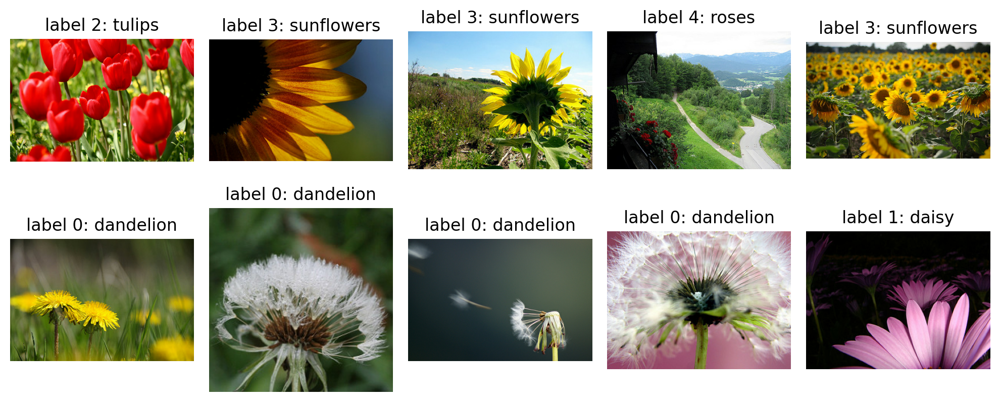

In [83]:
# 이미지 확인
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
# 시각화 이미지의 크기 지정.
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')
    plt.tight_layout()

### -> 확인해보니 샘플 이미지의 크기가 다 제각각이기 때문에 리사이징하기.



* label 0 : dandelion
* label 1 : daisy 🌼
* label 2: tuplips 🌷
* label 3: sunflowers 🌻
* label 4: roses🌹


## Step 2. 데이터셋을 모델에 넣을 수 있는 형태로 준비하기

In [84]:
# 이미지 크기 동일 및 픽셀 정규화
IMG_SIZE = 160
# 이미지 리사이징 함수 설계.
def format_example(image, label):
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label
# 훈련 데이터셋, 검증 데이터셋, 테스트 데이터셋 이미지 모두 리사이징 진행.
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)
print("완료")

완료


In [85]:
# 리사이징한 데이터셋의 크기를 출력하여 확인해보기.
print(train)
print(validation)
print(test)

<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


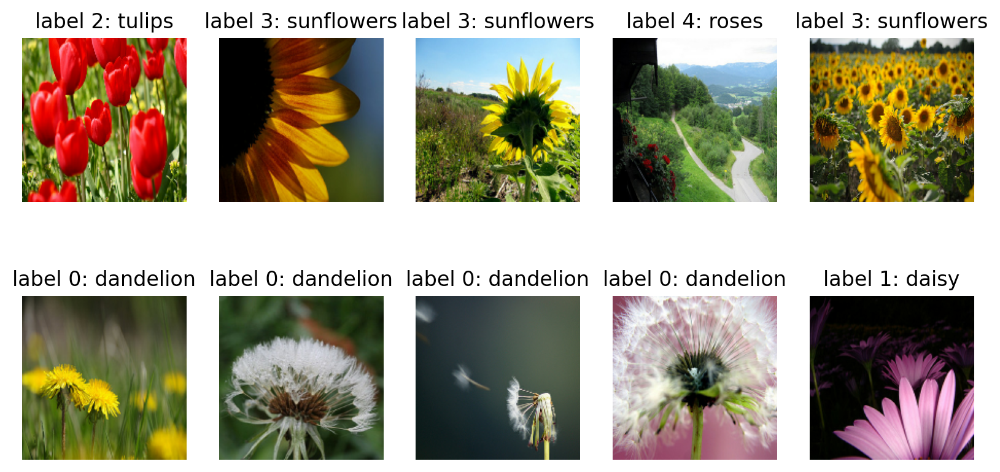

In [86]:
# 이미지 출력
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

### ->모든 이미지 동일한 크기로 처리된 것을 확인함.

## Step 3. 모델 설계하기 - Conv2D model
1. 노드에서 설계한 conv2D 모델을 학습시켜 성능을 확인해보기.
    - 과정
        - 처음부터 학습시키기.
    - 결과
        - 정확도가 60~70%, 성능이 좋지 않음.
2. **사전 훈련된 EfficientNetBo 모델**을 학습시켜 성능을 확인해보기.
    - 과정
        - 분류기인 Dense layer 3개를 제외하고 모델 불러오기.
        - Dense layer 직접 설계하여 추가하기.
        - 분류기만 학습시키기.
    - 결과
        - 정확도가 거의 90%에 가까움. 성능이 Conv2D 모델보다 대약 20% 향상됨.

In [87]:
# conv2 모델 그대로 사용하기
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])

print("완료")

완료


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [88]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 160, 160, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 80, 80, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 80, 80, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 40, 40, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 40, 40, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 20, 20, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 25600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 512)                 │      13,107,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 5)                   │           2,565 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,133,861 (50.10 MB)

 Trainable params: 13,133,861 (50.10 MB)

 Non-trainable params: 0 (0.00 B)

## Step 4. 모델 학습시키기 - Conv2D model

In [89]:
# 모델 컴파일
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [90]:
# Batch size 및 random 설정
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [91]:
# train_batches/ validation_batches / test_batches 준비
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [92]:
# 이미지와 라벨의 텐서 크기를 확인
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [93]:
# 검증 데이터를 repeat() 처리하여 반복적으로 사용할 수 있게 함
validation_batches_repeat = validation_batches.repeat()

# 초기 모델 성능 확인
validation_steps = 20  # 평가에 사용할 validation 배치 수
loss0, accuracy0 = model.evaluate(validation_batches_repeat, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - accuracy: 0.1577 - loss: 1.6172
initial loss: 1.62
initial accuracy: 0.15


In [94]:
# 모델 학습
EPOCHS = 15
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - accuracy: 0.3893 - loss: 1.4162 - val_accuracy: 0.5777 - val_loss: 1.0723
Epoch 2/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - accuracy: 0.5732 - loss: 1.0487 - val_accuracy: 0.5722 - val_loss: 1.0592
Epoch 3/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - accuracy: 0.6628 - loss: 0.8811 - val_accuracy: 0.5640 - val_loss: 1.0891
Epoch 4/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.7167 - loss: 0.7720 - val_accuracy: 0.6403 - val_loss: 0.9209
Epoch 5/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - accuracy: 0.7779 - loss: 0.6591 - val_accuracy: 0.6104 - val_loss: 0.9719
Epoch 6/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - accuracy: 0.8049 - loss: 0.5749 - val_accuracy: 0.6294 - val_loss: 0.9508
Epoch 7/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - accuracy: 0.8614 - loss: 0.4591 - val_accuracy: 0.6757 - val_loss: 0.9153
Epoch 8/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - accuracy: 0.9049 - loss: 0.3641 - val_accuracy: 0.6349 - v

### -> 정확도 60~70% 사이임. 다소 낮음.

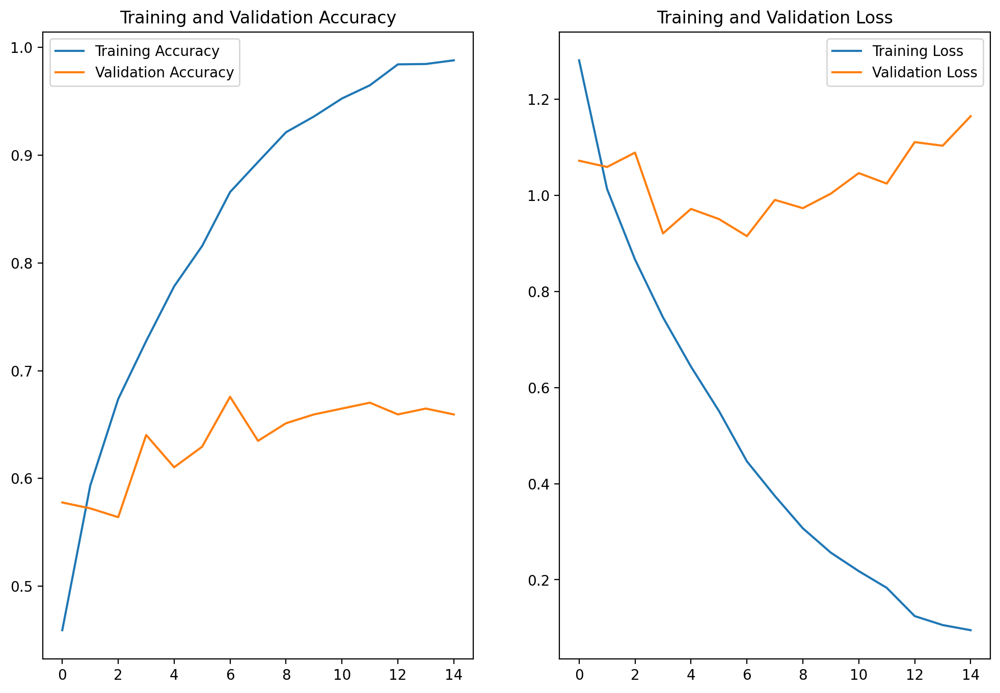

In [95]:
# 그래프 출력
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [96]:
# 테스트 데이터셋에서 하나의 배치를 가져와 예측을 수행
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


array([[8.41973524e-04, 1.90761162e-03, 7.06189126e-02, 1.79181293e-01,
        7.47450173e-01],
       [9.29314613e-01, 7.03078434e-02, 2.90634518e-04, 2.12097279e-06,
        8.48387062e-05],
       [8.25564504e-01, 1.24518042e-02, 1.16954789e-01, 4.22403142e-02,
        2.78867385e-03],
       [2.00011700e-01, 2.15784416e-01, 5.22411644e-01, 1.22944126e-03,
        6.05627932e-02],
       [8.93085957e-01, 3.03099044e-02, 9.69400443e-03, 2.71924469e-03,
        6.41909242e-02],
       [3.48915249e-01, 6.05902255e-01, 3.25816660e-03, 2.22216686e-03,
        3.97021696e-02],
       [8.11597798e-04, 3.85117799e-01, 5.38604915e-01, 7.62684830e-03,
        6.78388402e-02],
       [3.58189456e-02, 2.16173604e-02, 9.79941804e-03, 1.62097234e-02,
        9.16554570e-01],
       [8.37285351e-03, 1.27794749e-06, 1.47228048e-03, 9.90119457e-01,
        3.40531478e-05],
       [9.99400377e-01, 4.59532603e-04, 2.26427346e-06, 7.16078489e-07,
        1.37178853e-04],
       [9.95886385e-01, 2.0506

In [97]:
# 예측 결과를 클래스 번호로 출력
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([4, 0, 0, 2, 0, 1, 2, 4, 3, 0, 0, 0, 3, 4, 4, 3, 2, 0, 0, 0, 2, 0,
       1, 0, 1, 0, 4, 0, 2, 1, 0, 0])

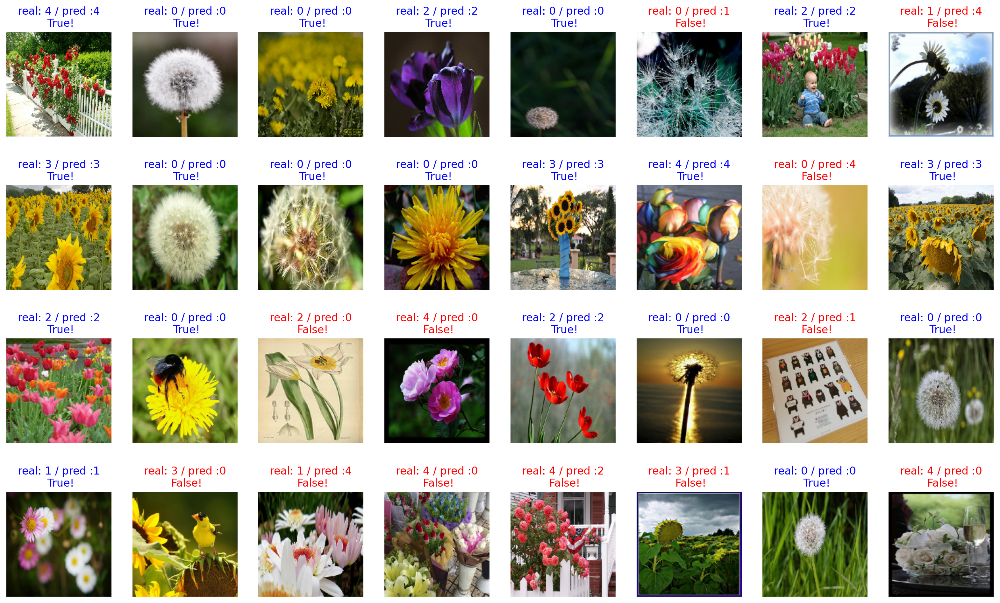

In [98]:
# 그래프 출력
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [99]:
# 정답의 비율
count = 0
for image, label, prediction in zip(images, labels, predictions):
    if label == prediction:
        count += 1

print(count / 32 * 100)

62.5


정확도가 낮기 때문에 전이 학습 시도 !! 모델도 빠꿔서 시도해 보자 !!

## Step 3. 모델 설계하기 - EfficientNetBo model

In [126]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras import Input

# 이미지 크기 설정
IMG_SIZE = 160
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# EfficientNetB0 base model 로드
base_model = EfficientNetB0(input_shape=IMG_SHAPE,
                            include_top=False,
                            weights='imagenet')

In [127]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [128]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 1280])

In [129]:
base_model.summary()

Model: "efficientnetb0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9             │ (None, 160, 160, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_8 (Rescaling)   │ (None, 160, 160, 3)    │              0 │ input_layer_9[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization_4           │ (None, 160, 160, 3)    │              7 │ rescaling_8[0][0]      │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_9 (Rescaling)   │ (None, 160, 160, 3)    │              0 │ normalization_4[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 161, 161, 3)    │              0 │ rescaling_9[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 80, 80, 32)     │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 80, 80, 32)     │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 80, 80, 32)     │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 80, 80, 32)     │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 80, 80, 32)     │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 80, 80, 32)     │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 4,049,571 (15.45 MB)

 Trainable params: 4,007,548 (15.29 MB)

 Non-trainable params: 42,023 (164.16 KB)

### 분류기를 태스크에 맞게 설계 및 추가하기

In [130]:
inputs = tf.keras.Input(shape=(160, 160, 3))
x = base_model(inputs, training=False)  # Feature extractor
x = tf.keras.layers.GlobalAveragePooling2D()(x)

x = tf.keras.layers.Dense(512)(x)
x = tf.keras.layers.BatchNormalization()(x)  # Dense층 이후에 batch 정규화 추가
x = tf.keras.layers.Activation('relu')(x)  #  활성화 함수 따로 사용
x = tf.keras.layers.Dropout(0.4)(x)

outputs = tf.keras.layers.Dense(5, activation='softmax')(x)
model = tf.keras.Model(inputs, outputs)

In [131]:
model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)          │ (None, 160, 160, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb0 (Functional)          │ (None, 5, 5, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_3           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 512)                 │         655,872 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 5)                   │           2,565 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,710,056 (17.97 MB)

 Trainable params: 4,667,009 (17.80 MB)

 Non-trainable params: 43,047 (168.16 KB)

## Step 4. 모델 학습시키기 - EfficientNetBo model

In [132]:
from tensorflow.keras.callbacks import EarlyStopping
# 조기 종료 콜백 정의
early_stop = EarlyStopping(
    monitor='val_accuracy',
    patience=5,
    restore_best_weights=True,
    min_delta=0.001,
    verbose=1
)

In [133]:
# 모델 컴파일
learning_rate = 0.0001
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
    loss=tf.keras.losses.sparse_categorical_crossentropy,
    metrics=['accuracy']
)

In [134]:
# 모델의 초기성능 확인
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 ━━━━━━━━━━━━━━━━━━━━ 14s 232ms/step - accuracy: 0.2793 - loss: 1.6477
initial loss: 1.64
initial accuracy: 0.28


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


In [135]:
# 모델 학습
EPOCHS = 25
history = model.fit(
    train_batches,
    epochs=EPOCHS,
    validation_data=validation_batches,
    callbacks=[early_stop]
)

Epoch 1/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 143s 571ms/step - accuracy: 0.4522 - loss: 1.4095 - val_accuracy: 0.2452 - val_loss: 1.6152
Epoch 2/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - accuracy: 0.8250 - loss: 0.4967 - val_accuracy: 0.2507 - val_loss: 1.7845
Epoch 3/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - accuracy: 0.8814 - loss: 0.3252 - val_accuracy: 0.3569 - val_loss: 1.7767
Epoch 4/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - accuracy: 0.9301 - loss: 0.2125 - val_accuracy: 0.5123 - val_loss: 1.3227
Epoch 5/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - accuracy: 0.9515 - loss: 0.1529 - val_accuracy: 0.6540 - val_loss: 0.9544
Epoch 6/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - accuracy: 0.9585 - loss: 0.1258 - val_accuracy: 0.8202 - val_loss: 0.4842
Epoch 7/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - accuracy: 0.9666 - loss: 0.1023 - val_accuracy: 0.7847 - val_loss: 0.5971
Epoch 8/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - accuracy: 0.9716 - loss: 0.0764 - val_accuracy: 0.871

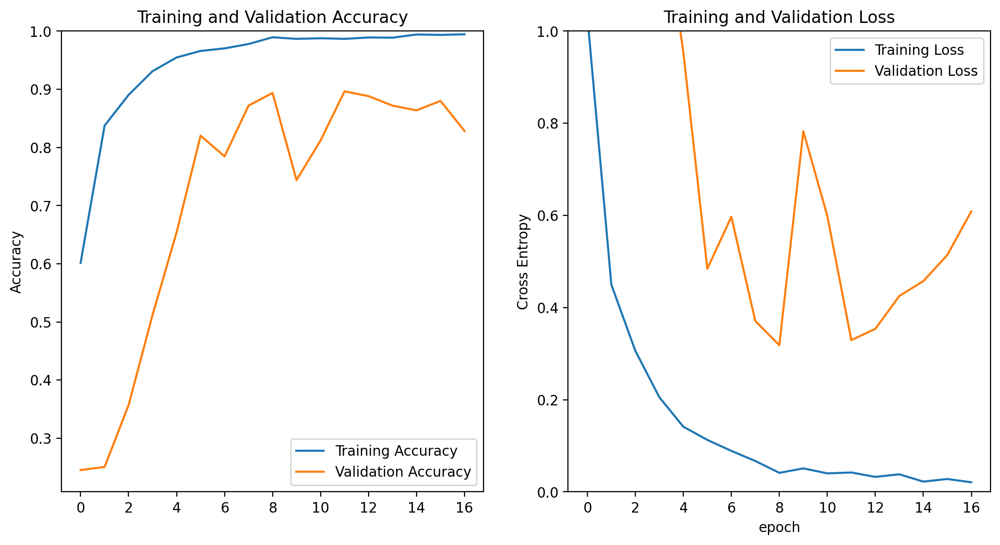

In [136]:
# 그래프 출력
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [137]:
# 테스트 데이터셋에서 하나의 배치를 가져와 예측을 수행
for image_batch, label_batch in test_batches.take(2):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


array([[2.90790712e-03, 1.11045246e-03, 2.22277507e-01, 2.36526644e-03,
        7.71338880e-01],
       [5.42474772e-05, 1.82154618e-05, 3.03741581e-06, 2.11114511e-05,
        9.99903321e-01],
       [1.42247198e-04, 1.73254812e-04, 9.99512196e-01, 1.73941771e-05,
        1.54924870e-04],
       [8.75148942e-07, 9.99996066e-01, 1.59883041e-06, 1.48692061e-06,
        8.43779091e-08],
       [2.59306538e-03, 1.27689075e-03, 4.62497324e-02, 2.84926849e-03,
        9.47031081e-01],
       [9.98112202e-01, 1.47636514e-03, 2.25679847e-04, 7.23237317e-05,
        1.13381699e-04],
       [7.18501389e-01, 2.16538236e-01, 3.09030954e-02, 2.60255300e-02,
        8.03177990e-03],
       [1.79393265e-08, 7.87435783e-06, 2.57045212e-06, 9.99983549e-01,
        5.94183075e-06],
       [1.77648675e-04, 1.25577746e-04, 5.87201976e-05, 7.24140482e-05,
        9.99565661e-01],
       [1.86204648e-04, 1.88630854e-03, 8.95642384e-04, 9.95177269e-01,
        1.85456325e-03],
       [7.41953787e-04, 8.3558

In [138]:
# 예측 결과를 클래스 번호로 출력
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([4, 4, 2, 1, 4, 0, 0, 3, 4, 3, 3, 2, 1, 1, 0, 0, 4, 2, 4, 1, 4, 1,
       2, 2, 4, 4, 1, 1, 4, 3, 3, 1])

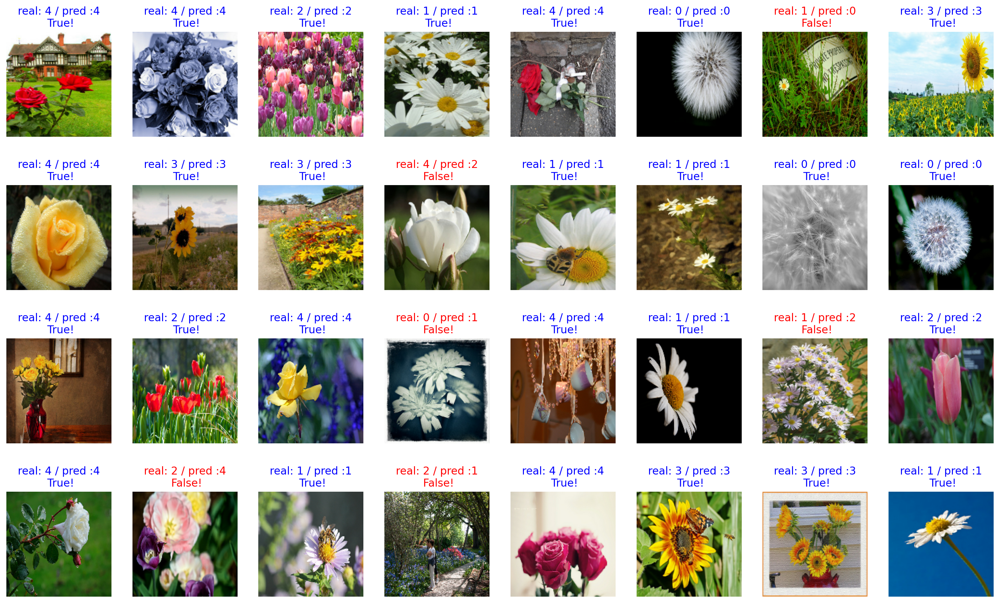

In [139]:
# 예측 결과 시각화
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [140]:
# 테스트셋에서 모델 평가 (테스트 정확도 출력)
test_loss, test_accuracy = model.evaluate(test_batches)

print(f"테스트 손실 (Loss): {test_loss:.4f}")
print(f"테스트 정확도 (Accuracy): {test_accuracy:.4f}")

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - accuracy: 0.8917 - loss: 0.3753
테스트 손실 (Loss): 0.2858
테스트 정확도 (Accuracy): 0.9128


In [141]:
from sklearn.metrics import classification_report
import numpy as np

# 1. 테스트셋에서 이미지와 라벨 가져오기 (Batch가 여러 개일 수 있으므로 모두 합침)
test_images = []
test_labels = []

for img_batch, label_batch in test_batches:
    test_images.extend(img_batch)
    test_labels.extend(label_batch)

# numpy 배열로 변환
test_images = np.array(test_images)
test_labels = np.array(test_labels)

# 2. 예측 수행
pred_probs = model.predict(test_images)
pred_labels = np.argmax(pred_probs, axis=1)  # 예측 클래스 라벨

# 3. classification_report 출력
from sklearn.metrics import classification_report

print(classification_report(test_labels, pred_labels, target_names=metadata.features['label'].names))

12/12 ━━━━━━━━━━━━━━━━━━━━ 8s 740ms/step
              precision    recall  f1-score   support

   dandelion       0.96      0.96      0.96        70
       daisy       0.93      0.89      0.91        61
      tulips       0.83      0.87      0.85        85
  sunflowers       0.99      0.97      0.98        76
       roses       0.88      0.88      0.88        75

    accuracy                           0.91       367
   macro avg       0.92      0.91      0.92       367
weighted avg       0.91      0.91      0.91       367



## Step 5. 모델 저장하기

In [142]:
model.save('/content/drive/MyDrive/tfds/flowers/final_model_after_test.h5')

In [143]:
# # Drive에 저장할 경로 (원하는 폴더 경로로 수정 가능)
# !cp best_model.h5 /content/drive/MyDrive/tfds/flowers/my_flower_model.h5

위에서 학습하면서 모델을 저장했지만 런타임 해제시 사라지기 때문에 구글 드라이브에 영구 저장

In [144]:
from tensorflow.keras.models import load_model

# 구글 드라이브 경로에서 모델 불러오기
model_path = '/content/drive/MyDrive/tfds/flowers/final_model_after_test.h5'
model = load_model(model_path)

print("✅ 모델 불러오기 완료!")

✅ 모델 불러오기 완료!
